In [2]:
import os
import numpy as np

import torchvision
from skimage import feature
from skimage import transform
from scipy import ndimage

from PIL import Image

import matplotlib.pyplot as plt
import matplotlib.patches as patches
from tqdm.notebook import tqdm

In [3]:
DATA_PATH = "data/shampoo/train/"

train_dataset = torchvision.datasets.CocoDetection(DATA_PATH, DATA_PATH + "_annotations.coco.json")
train_dataset

loading annotations into memory...
Done (t=0.08s)
creating index...
index created!


Dataset CocoDetection
    Number of datapoints: 437
    Root location: data/shampoo/train/

In [4]:
train_dataset.coco.cats

{0: {'id': 0, 'name': 'fine_thank_you', 'supercategory': 'none'},
 1: {'id': 1, 'name': 'eye_patch', 'supercategory': 'fine_thank_you'},
 2: {'id': 2, 'name': 'horizontal', 'supercategory': 'fine_thank_you'},
 3: {'id': 3, 'name': 'horizontal_defect', 'supercategory': 'fine_thank_you'},
 4: {'id': 4, 'name': 'shampoo', 'supercategory': 'fine_thank_you'},
 5: {'id': 5, 'name': 'vertical', 'supercategory': 'fine_thank_you'},
 6: {'id': 6, 'name': 'vertical_gap', 'supercategory': 'fine_thank_you'}}

In [5]:
class BBox:
    def __init__(self, x, y, w, h, category):
        self.x = x
        self.y = y
        self.w = w
        self.h = h

        self.category = category

    def plot(self, axis, color="black"):
        plot_rectangle(*self.xywh, axis, edgecolor=color)

    @property
    def xywh(self):
        return self.x, self.y, self.w, self.h

    @property
    def xyxy(self):
        return self.x, self.y, self.x + self.w, self.y + self.h


def get_bboxes(labels, categories=(5, 6)):
    return [BBox(*box["bbox"], box["category_id"]) for box in labels if box["category_id"] in categories]


def crop_image(image, bbox, greyscale=True):
    if isinstance(bbox, BBox):
        x, y, w, h = bbox.xywh
    else:
        x, y, w, h = bbox
    
    if isinstance(image, Image.Image):
        cropped = image.crop((x, y, x + w, y + h))
        cropped = np.array(cropped)
    else:
        cropped = image[x:x + w, y:y + h]

    if greyscale:
        cropped = cropped.mean(axis=-1)
    return cropped


def plot_rectangle(x, y, w, h, a, **kwargs):
    a.add_patch(patches.Rectangle((x, y), w, h, facecolor="none", **kwargs))


def plot_images(images, transform=None, callback=None):
    _, axes = plt.subplots(1, len(images))

    for axis, (image, color) in zip(axes, images):
        axis.xaxis.set_visible(False)
        axis.yaxis.set_visible(False)
        plt.setp(axis.spines.values(), color="red" if color else "black")

        image = image if transform is None else transform(image)
        axis.imshow(image, cmap="bone", interpolation="none")

        if callback:
            callback(image, axis)

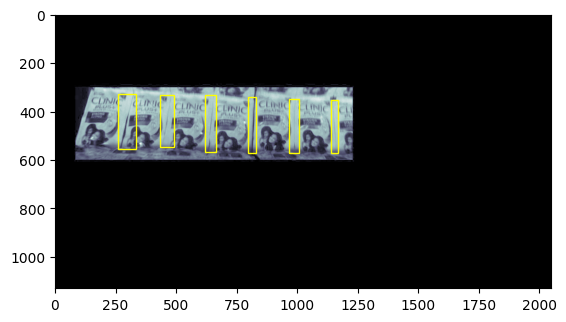

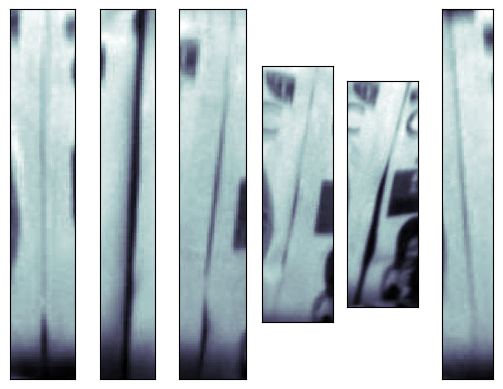

In [12]:
img, boxes = train_dataset[15]

ax = plt.gca()
ax.imshow(np.array(img)[:, :, 0] ** 0.5, cmap="bone")

bboxes = get_bboxes(boxes)
crops = [(crop_image(img, bbox), bbox.category == 5) for bbox in bboxes]

for bbox in bboxes:
    bbox.plot(ax, color="red" if bbox.category == 5 else "yellow")
plot_images(crops)

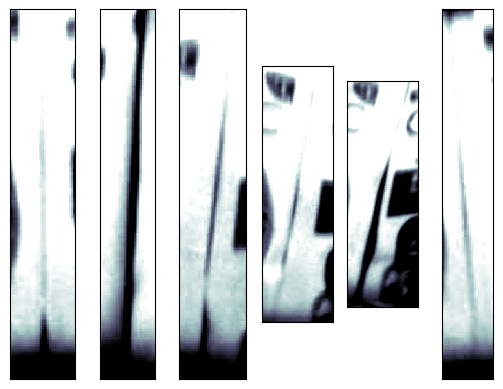

In [13]:
from skimage import exposure


def equalise(image):
    return exposure.equalize_hist(image, nbins=2)


plot_images(crops, transform=equalise)

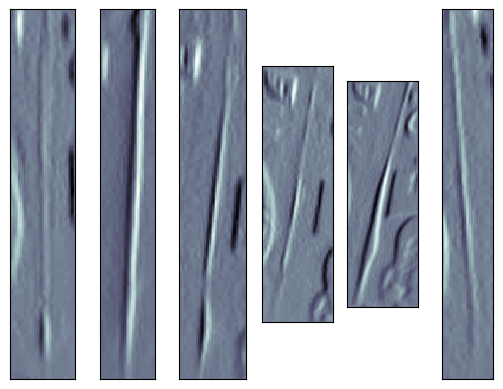

In [14]:
def sobel(image):
    # image = equalise(image)
    return ndimage.sobel(image ** 1, 1)


plot_images(crops, transform=sobel)

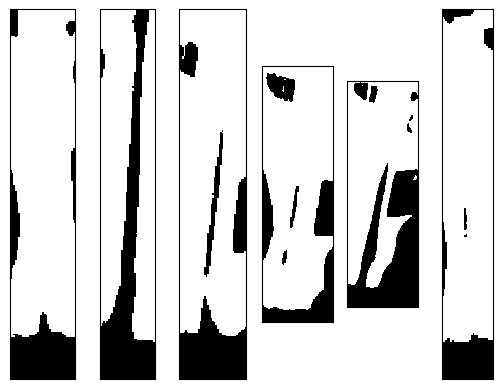

In [15]:
def threshold(image):
    image = equalise(image)
    return image > 0.7


plot_images(crops, transform=threshold)

In [21]:
from scipy import ndimage

SIGMA = 2
LOW = 0
HIGH = 10


def gradient(x):
    return np.gradient(x)[1]


def laplacian(x):
    return ndimage.laplace(x)


def canny(x, sigma=None, low=None, high=None):
    x = np.gradient(x)[1]
    # x = ndimage.laplace(x)
    # x = sobel(x)
    x = feature.canny(x, sigma=sigma if sigma else SIGMA, low_threshold=low if low else LOW,
                      high_threshold=high if high else HIGH)
    return x


plot_images(crops, transform=canny)

ValueError: Number of columns must be a positive integer, not 0

<Figure size 640x480 with 0 Axes>

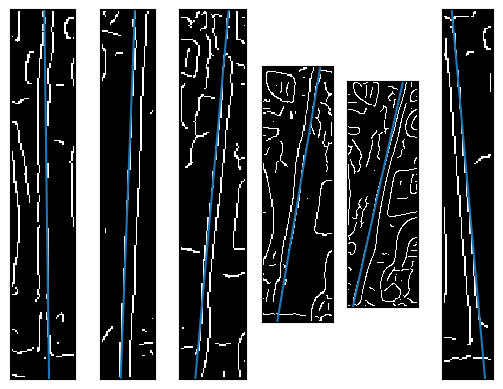

In [17]:
THRESHOLD = None

tested_angles = np.linspace(-np.pi / 4, np.pi / 4, 61, endpoint=False)


def hough_transform(image, axis=None, threshold=None):
    hough = transform.hough_line(image, theta=tested_angles)
    peaks = transform.hough_line_peaks(*hough, threshold=threshold if threshold else THRESHOLD, num_peaks=1)

    if axis:
        for _, angle, dist in zip(*peaks):
            x0 = dist * np.cos(angle)
            y0 = dist * np.sin(angle)
            axis.axline((x0, y0), slope=np.tan(angle + np.pi / 2))

    return peaks


plot_images(crops, transform=canny, callback=hough_transform)

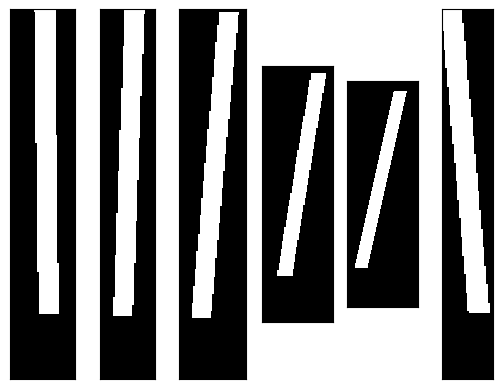

In [18]:
# Credit where credit is due: https://stackoverflow.com/questions/31638651/how-can-i-draw-lines-into-numpy-arrays

def trapez(y, y0, w):
    return np.clip(np.minimum(y + 1 + w / 2 - y0, -y + 1 + w / 2 + y0), 0, 1)


def weighted_line(r0, c0, r1, c1, w, rmin=0, rmax=np.inf):
    # The algorithm below works fine if c1 >= c0 and c1-c0 >= abs(r1-r0).
    # If either of these cases are violated, do some switches.
    if abs(c1 - c0) < abs(r1 - r0):
        # Switch x and y, and switch again when returning.
        xx, yy, val = weighted_line(c0, r0, c1, r1, w, rmin=rmin, rmax=rmax)
        return yy, xx, val

    # At this point we know that the distance in columns (x) is greater
    # than that in rows (y). Possibly one more switch if c0 > c1.
    if c0 > c1:
        return weighted_line(r1, c1, r0, c0, w, rmin=rmin, rmax=rmax)

    # The following is now always < 1 in abs
    slope = (r1 - r0) / (c1 - c0)

    # Adjust weight by the slope
    w *= np.sqrt(1 + np.abs(slope)) / 2

    # We write y as a function of x, because the slope is always <= 1
    # (in absolute value)
    x = np.arange(c0, c1 + 1, dtype=float)
    y = x * slope + (c1 * r0 - c0 * r1) / (c1 - c0)

    # Now instead of 2 values for y, we have 2*np.ceil(w/2).
    # All values are 1 except the upmost and bottommost.
    thickness = np.ceil(w / 2)
    yy = (np.floor(y).reshape(-1, 1) + np.arange(-thickness - 1, thickness + 2).reshape(1, -1))
    xx = np.repeat(x, yy.shape[1])
    vals = trapez(yy, y.reshape(-1, 1), w).flatten()

    yy = yy.flatten()

    # Exclude useless parts and those outside of the interval
    # to avoid parts outside the picture
    mask = np.logical_and.reduce((yy >= rmin, yy < rmax, vals > 0))

    return yy[mask].astype(int), xx[mask].astype(int), vals[mask]
    
    
WIDTH = 20


def hough_mask(x, threshold=None):
    edges = canny(x)
    hough = transform.hough_line(edges, theta=tested_angles)
    peaks = transform.hough_line_peaks(*hough, threshold=threshold if threshold else THRESHOLD, num_peaks=1)

    mask = np.zeros(x.shape, dtype="bool")
    
    for _, angle, dist in zip(*peaks):    
        x0 = dist * np.cos(angle)
        y0 = dist * np.sin(angle)
        slope = np.tan(angle + np.pi / 2)
        intercept = y0 - slope * x0

        y1 = x.shape[0] - WIDTH * 2
        x1 = (y1 - intercept) / slope
        
        rr, cc, _ = weighted_line(y0, x0, y1, x1, w=WIDTH, rmin=0, rmax=x.shape[1])
        mask[rr, cc] = True
    
    # x = equalise(x)
    # x = x * mask
    return mask


plot_images(crops, transform=hough_mask)

In [19]:
def predict_defective(image, sigma, low, high, threshold):
    image = canny(image, sigma=sigma, low=low, high=high)
    peaks = hough_transform(image, threshold=threshold)[0]
    return len(peaks) == 0


def predict_defective2(image, sigma, low, high, threshold):
    image = canny(image, sigma=sigma, low=low, high=high)
    
    mask = hough_mask(image, threshold=threshold)
    image = equalise(image)
    mean = image[mask].mean()
    
    return mean < 0.5


def test_all(sigma, low, high, threshold):
    results = []
    labels = []

    for image, label in tqdm(train_dataset):
        for box in label:
            if box["category_id"] not in {5, 6}:
                continue
            y = box["category_id"] == 5

            crop = crop_image(image, box["bbox"])
            y_hat = predict_defective2(crop, sigma, low, high, threshold)
            results.append(y == y_hat)
            labels.append(y)

    results = np.array(results)
    labels = np.array(labels)
    print(f"""
    Correct: {int(results.sum())} / {len(results)}
    
    Accuracy on Non-Defective: {100 * results[labels == False].mean():.2f}%
    Accuracy on Defective: {100 * results[labels == True].mean():.2f}%
    Accuracy: {100 * float(results.mean()):.2f}%
    """)
    return results

In [ ]:
res = test_all(sigma=2, low=0, high=10, threshold=None)

In [7]:
import os
from ultralytics import YOLO

model = YOLO("models/08_07_negative_shampoo.pt")
model.to("mps")

YOLO(
  (model): SegmentationModel(
    (model): Sequential(
      (0): Conv(
        (conv): Conv2d(3, 48, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(48, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (1): Conv(
        (conv): Conv2d(48, 96, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(96, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (2): C2f(
        (cv1): Conv(
          (conv): Conv2d(96, 96, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(96, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
          (act): SiLU(inplace=True)
        )
        (cv2): Conv(
          (conv): Conv2d(192, 96, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(96, eps=0.001, momentum=0.03, affine=True, track_runni

  0%|          | 0/77 [00:00<?, ?it/s]

/var/folders/r5/mzzh3rn14lgb2__wr5h7swqm0000gn/T/ipykernel_68488/449612893.py:22: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


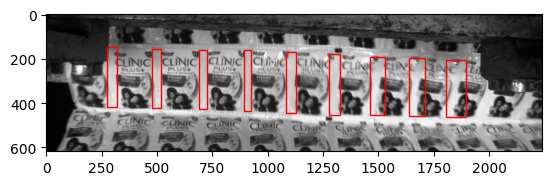

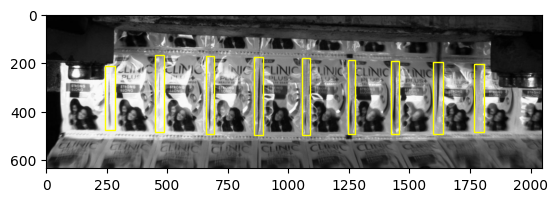

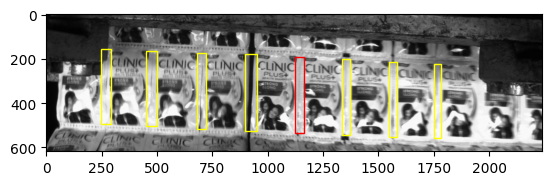

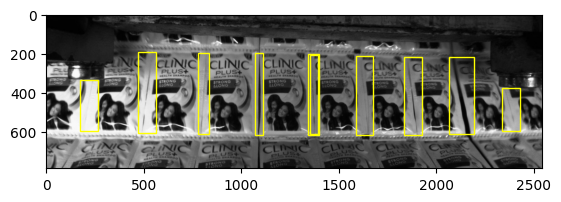

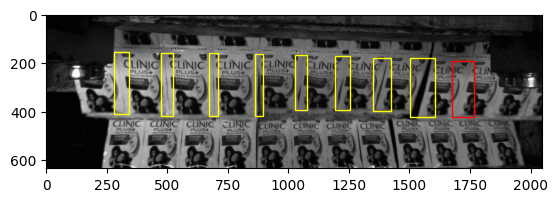

...

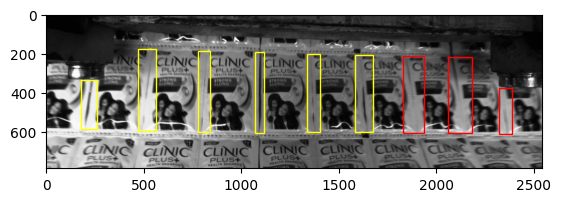

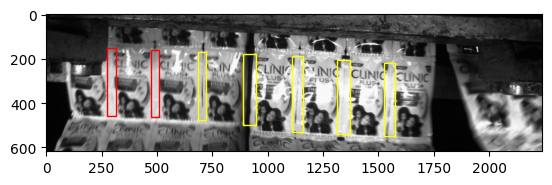

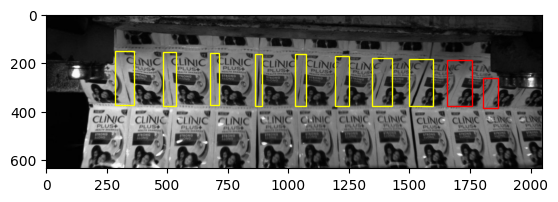

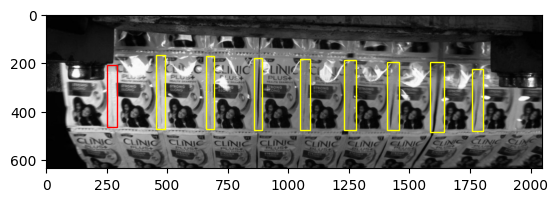

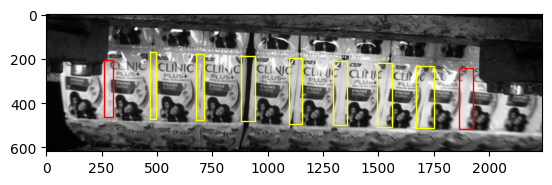

In [22]:
results = []
classifications = []

for source in tqdm(os.listdir("data/shampoo_defect2/")):
    source = "data/shampoo_defect2/" + source
    
    for result in model(source, classes=[4], verbose=False):
        results.append(result)
        
        for x0, y0, x1, y1 in result.boxes.xyxy:
            x0, y0, x1, y1 = map(int, (x0, y0, x1, y1))
            w = x1 - x0
            h = y1 - y0
            
            crop = 255 - crop_image(result.orig_img, (y0, x0, h, w))
            defective = predict_defective(crop, 2, 0, 13, 80)
            classifications.append(defective)

classifications = iter(classifications)

for result in results:
    plt.figure()
    plt.imshow(255 - result.orig_img)

    crops = []
    for x0, y0, x1, y1 in result.boxes.xyxy:
        x0, y0, x1, y1 = map(lambda tensor: tensor.cpu(), (x0, y0, x1, y1))
        plot_rectangle(x0, y0, x1 - x0, y1 - y0, plt.gca(), edgecolor="red" if next(classifications) else "yellow")